##### top

# FMP modelling for Figure 2

This notebook runs Bayesian models on Datasets 1, 2, 3 and Concatenated Dataset 123 to assess interaction between perception and memory difficulty levels in the FMP. We fit the following formulas to mean score within the condition. Throughout the notebook, I use `task` as a term for memory difficulty levels (M, UD, FD-e), `difficulty` as a term for perceptual difficulty levels (1, 2, 3), and `userID` as a variable denoting individual participants.

* Model task (memory level) and difficulty (perceptual level) interaction with user (participant) as a random effect. Equation:
    * _correct_flt ~ task * difficulty + (1|userID)_
* Model task and difficulty as main effects without interaction with user as a random effect. Equation:
    * _correct_flt ~ task + difficulty + (1|userID)_

The datasets bear the same names as in the article:
* `dataset_1`
* `dataset_2` - randomised stimuli matched for entropy
* `dataset_3` - randomising cue stimulus
* and a new dataset that is a concatenation of the three datasets above -> `concat_datasets_123`

---

* [Models](#Models)
* [Plot results](#Plot-results)
* [Compare all data](#Compare-all-data)
* [Save the inference](#Save-the-inference)

In [1]:
import os, sys
import pickle
from os.path import join as opj
import arviz as az
import bambi as bmb
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

az.style.use("arviz-darkgrid")
SEED = 7355608


# Importing module for functions
functions_modul =  "./functions"
sys.path.insert(0, functions_modul)

# import all processing and plotting functions
from bayesian_modelling_functions import fit_model, print_model

path_general = "../"
path_data = opj(path_general, "Data", "datasets")
path_inference_data = opj(path_general, "Data", "model_inference_data")


# set the numer of CPU
num_cpu = min(4, os.cpu_count()-1)
print(f'We will have {num_cpu} cores.\n')


path_dic = {
    'dataset_1' : opj(path_data, 'FMP_dataset_1.csv'),
    'dataset_2': opj(path_data, 'FMP_dataset_2.csv'),
    'dataset_3': opj(path_data, 'FMP_dataset_3.csv'),
    'concat_datasets_123': opj(path_data, 'FMP_concat_datasets_123.csv'),
#     'dataset_4': opj(path_data, 'FMP_dataset_4.csv'),
}


#####
# rename the levels
rename_tasks_dic = {'perception':'Matching', 'perc':'Matching', 'blank':'Unfilled Delay', 'faces':'Filled Delay - emotions', 'math':'Filled Delay - math'}

# define orders
hue_order = ['Matching', 'Unfilled Delay', 'Filled Delay - emotions']
hue_order_math = ['Matching', 'Unfilled Delay', 'Filled Delay - emotions', 'Filled Delay - math']


# load all dataframes
df_dic = {}

# only selected cols
select_cols = ['stim1', 'stim2', 'target', 'RT', 'userID', 'difficulty', 'levels', 'task', 'correct_flt', 'order']


for f in path_dic.keys():   
    if 'longitudinal_' in f or f=='dataset_3':
        df_dic[f] = pd.read_csv(path_dic[f], usecols=select_cols+['target_loc', 'target_loc_simple'])
    else:
        df_dic[f] = pd.read_csv(path_dic[f], usecols=select_cols)
    
    df_dic[f]["Experiment"] = f
    
    # rename the memory task labels in the df
    df_dic[f]['task'] = df_dic[f]['task'].map(rename_tasks_dic).fillna(df_dic[f]['task'])
        

    # clean
    df_dic[f].reset_index(drop=True, inplace=True)
    
    if 'Unnamed: 0' in df_dic[f].columns:
        df_dic[f].drop('Unnamed: 0', inplace=True, axis=1)
        
    
    # find low performing participants - just a check, there should not be any
    tt = df_dic[f].loc[df_dic[f]['task'].isin(['face matching', 'perc', 'perception'])].groupby(['userID', 'difficulty']).correct_flt.mean()

    drop_ptc = tt[tt<=0.5].reset_index().userID.values
    print(f'\nIn {f} dropping {len(drop_ptc)} participants for low accuracy in FM.')
    print(tt[tt<=0.5])

    # and remove them
    df_dic[f] = df_dic[f].loc[~df_dic[f]['userID'].isin(drop_ptc)]
    # clean up
    drop_ptc, tt = None, None


We will have 4 cores.


In dataset_1 dropping 0 participants for low accuracy in FM.
Series([], Name: correct_flt, dtype: float64)

In dataset_2 dropping 0 participants for low accuracy in FM.
Series([], Name: correct_flt, dtype: float64)

In dataset_3 dropping 0 participants for low accuracy in FM.
Series([], Name: correct_flt, dtype: float64)

In concat_datasets_123 dropping 0 participants for low accuracy in FM.
Series([], Name: correct_flt, dtype: float64)


In [2]:
# select only specific datasets and prepare them
datasets2fit = ['dataset_1', 'dataset_2', 'dataset_3', 'concat_datasets_123']

df_dic_fit = {}


for f in datasets2fit:
    data=None
    
    # groupby and make means for ptc and condition
    data = df_dic[f].groupby(['userID', 'task', 'difficulty'], observed=False).correct_flt.mean().reset_index()

    # convert all variables to categories
    # categorical_cols = data.columns[data.dtypes == object].tolist() + ['difficulty']
    categorical_cols = ['userID', 'task', 'difficulty']
    for col in categorical_cols:
        if col == 'task':
            # specify the order that we want
            data[col] = pd.Categorical(data[col], categories=['Unfilled Delay', 'Matching', 'Filled Delay - emotions'], ordered=True)
            #['Unfilled Delay', 'Matching', 'Filled Delay - emotions']
            
            # also do it for the original datasets
            df_dic[f][col] = pd.Categorical(df_dic[f][col], categories=['Unfilled Delay', 'Matching', 'Filled Delay - emotions'], ordered=True)
        else:
            data[col] = data[col].astype("category")
            df_dic[f][col] = df_dic[f][col].astype("category")

    # check
    print('\n',f)
    df_dic[f].info()
        
    # save
    df_dic_fit[f] = data.copy()

# # drop them for now
# data[data.correct_flt.isna()]


 dataset_1
<class 'pandas.core.frame.DataFrame'>
Index: 46620 entries, 0 to 46619
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   stim1        46620 non-null  object  
 1   stim2        46620 non-null  object  
 2   target       46620 non-null  object  
 3   RT           45500 non-null  float64 
 4   userID       46620 non-null  category
 5   task         46620 non-null  category
 6   order        46620 non-null  int64   
 7   difficulty   46620 non-null  category
 8   levels       46620 non-null  int64   
 9   correct_flt  45500 non-null  float64 
 10  Experiment   46620 non-null  object  
dtypes: category(3), float64(2), int64(2), object(4)
memory usage: 3.4+ MB

 dataset_2
<class 'pandas.core.frame.DataFrame'>
Index: 27540 entries, 0 to 27539
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   userID       27540 non-null  category
 1   

## Models
[top](#top)

In [3]:
model_assumptions = {
    "correct_flt ~ task * difficulty + (1|userID)": "Each user has their own baseline performance, but the effect of task and difficulty is assumed to be the same across all users.",
    "correct_flt ~ task + difficulty + (1|userID)": "Assumes that each user has their own baseline performance, but the effects of task and difficulty are consistent across all users without any interaction between task and difficulty.",
}

# define what we want to run
formulas2run = [
    "correct_flt ~ task * difficulty + (1|userID)",
    "correct_flt ~ task + difficulty + (1|userID)",
]

In [4]:
# define where we will store the results
model_dic_bernoulli = {}
result_dic_bernoulli = {}

for f in df_dic_fit.keys():
    print(f'\nFitting dataset {f}\n')
    # create datasets
    if f not in model_dic_bernoulli.keys():
        model_dic_bernoulli[f] = {}
    if f not in result_dic_bernoulli.keys():
        result_dic_bernoulli[f] = {}
    
    for formula in formulas2run:
        print(f'\nFitting formula {formula}\n')
    
        model_dic_bernoulli[f][formula], result_dic_bernoulli[f][formula] = fit_model(formula, df_dic_fit[f], categorical_cols,
                                                                                      num_cpu=num_cpu, check_priors=False, sample_priors=False)

Sampling 4 chains, 0 divergences ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100% 0:00:00 / 0:00:34

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 34 seconds.


In [5]:
model_dic_bernoulli[f][formulas2run[0]]

       Formula: correct_flt ~ task * difficulty + (1|userID)
        Family: gaussian
          Link: mu = identity
  Observations: 6045
        Priors: 
    target = mu
        Common-level effects
            Intercept ~ Normal(mu: 0.7636, sigma: 0.7268)
            task ~ Normal(mu: [0. 0.], sigma: [0.8239 0.826 ])
            difficulty ~ Normal(mu: [0. 0.], sigma: [0.8246 0.8246])
            task:difficulty ~ Normal(mu: [0. 0. 0. 0.], sigma: [1.235  1.235  1.2406 1.2406])
        
        Group-level effects
            1|userID ~ Normal(mu: 0.0, sigma: HalfNormal(sigma: 0.7268))
        
        Auxiliary parameters
            sigma ~ HalfStudentT(nu: 4.0, sigma: 0.1555)
------
* To see a plot of the priors call the .plot_priors() method.
* To see a summary or plot of the posterior pass the object returned by .fit() to az.summary() or az.plot_trace()

In [6]:
model_dic_bernoulli[f][formulas2run[1]]

       Formula: correct_flt ~ task + difficulty + (1|userID)
        Family: gaussian
          Link: mu = identity
  Observations: 6045
        Priors: 
    target = mu
        Common-level effects
            Intercept ~ Normal(mu: 0.7636, sigma: 0.673)
            task ~ Normal(mu: [0. 0.], sigma: [0.8239 0.826 ])
            difficulty ~ Normal(mu: [0. 0.], sigma: [0.8246 0.8246])
        
        Group-level effects
            1|userID ~ Normal(mu: 0.0, sigma: HalfNormal(sigma: 0.673))
        
        Auxiliary parameters
            sigma ~ HalfStudentT(nu: 4.0, sigma: 0.1555)
------
* To see a plot of the priors call the .plot_priors() method.
* To see a summary or plot of the posterior pass the object returned by .fit() to az.summary() or az.plot_trace()

### check priors

Sampling: [1|userID_sigma, Intercept, difficulty, sigma, task, task:difficulty]


array([[<Axes: title={'center': 'Intercept'}>,
        <Axes: title={'center': 'sigma'}>,
        <Axes: title={'center': 'task\nMatching'}>],
       [<Axes: title={'center': 'task\nFilled Delay - emotions'}>,
        <Axes: title={'center': 'difficulty\n2'}>,
        <Axes: title={'center': 'difficulty\n3'}>],
       [<Axes: title={'center': 'task:difficulty\nMatching, 2'}>,
        <Axes: title={'center': 'task:difficulty\nMatching, 3'}>,
        <Axes: title={'center': 'task:difficulty\nFilled Delay - emotions, 2'}>],
       [<Axes: title={'center': 'task:difficulty\nFilled Delay - emotions, 3'}>,
        <Axes: title={'center': '1|userID_sigma'}>, <Axes: >]],
      dtype=object)

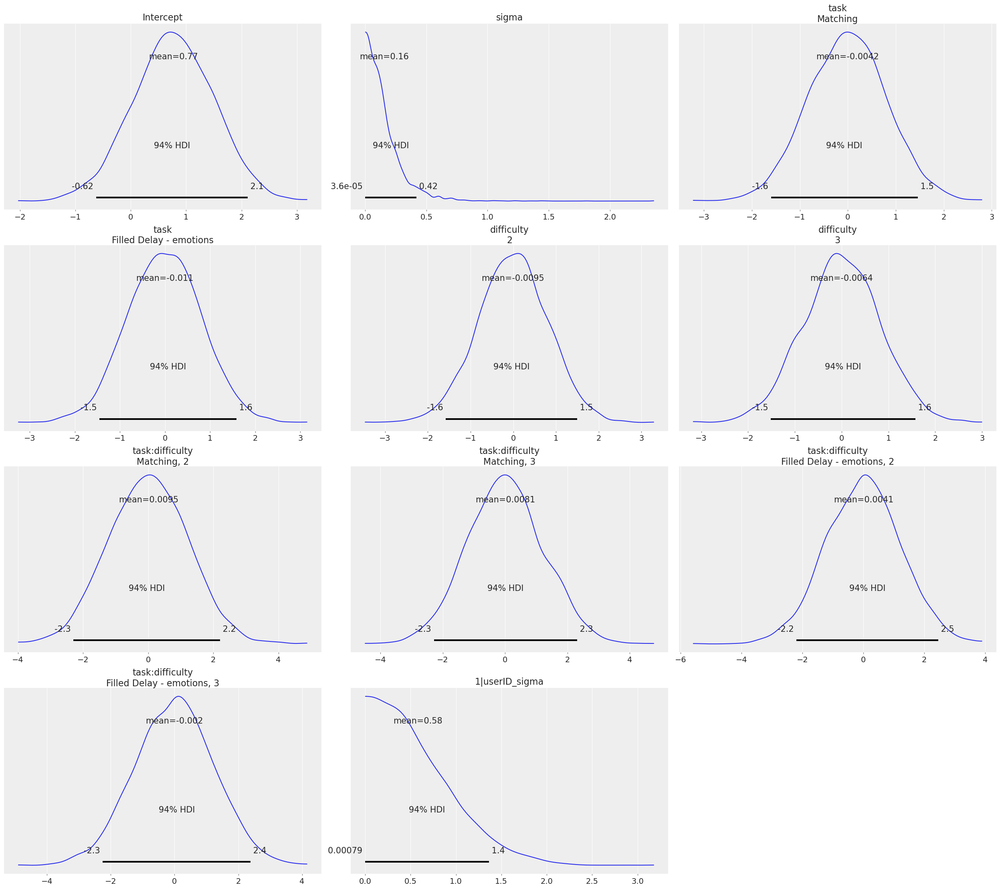

In [7]:
model_dic_bernoulli[f][formulas2run[0]].plot_priors()

Sampling: [1|userID_sigma, Intercept, difficulty, sigma, task]


array([[<Axes: title={'center': 'Intercept'}>,
        <Axes: title={'center': 'sigma'}>,
        <Axes: title={'center': 'task\nMatching'}>],
       [<Axes: title={'center': 'task\nFilled Delay - emotions'}>,
        <Axes: title={'center': 'difficulty\n2'}>,
        <Axes: title={'center': 'difficulty\n3'}>],
       [<Axes: title={'center': '1|userID_sigma'}>, <Axes: >, <Axes: >]],
      dtype=object)

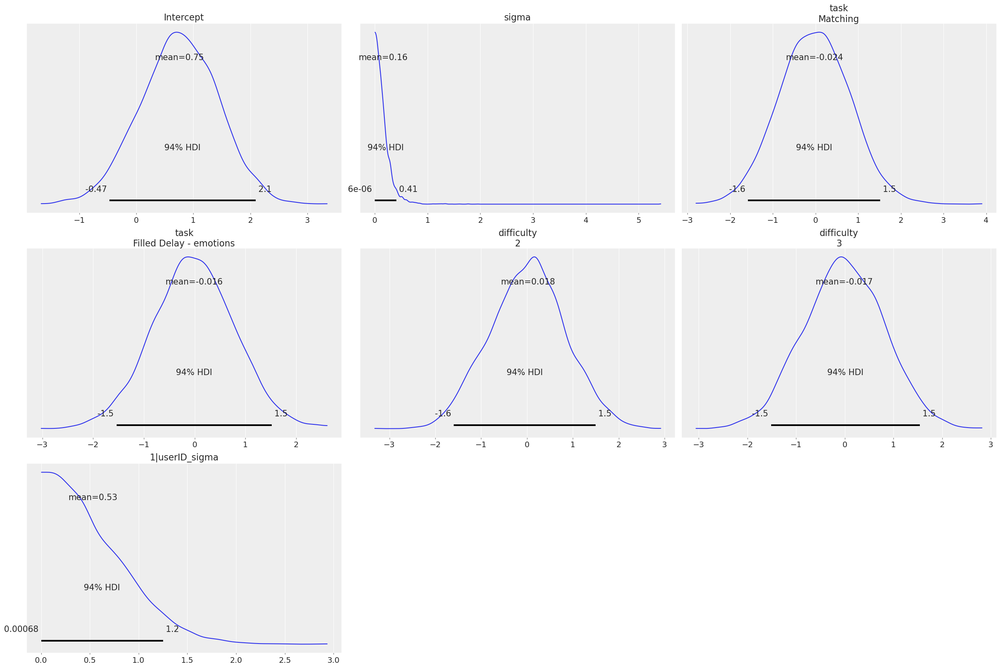

In [8]:
model_dic_bernoulli[f][formulas2run[1]].plot_priors()

### check posterior

array([[<Axes: title={'center': 'Intercept'}>,
        <Axes: title={'center': 'difficulty\n2'}>,
        <Axes: title={'center': 'difficulty\n3'}>],
       [<Axes: title={'center': 'task\nMatching'}>,
        <Axes: title={'center': 'task\nFilled Delay - emotions'}>,
        <Axes: >]], dtype=object)

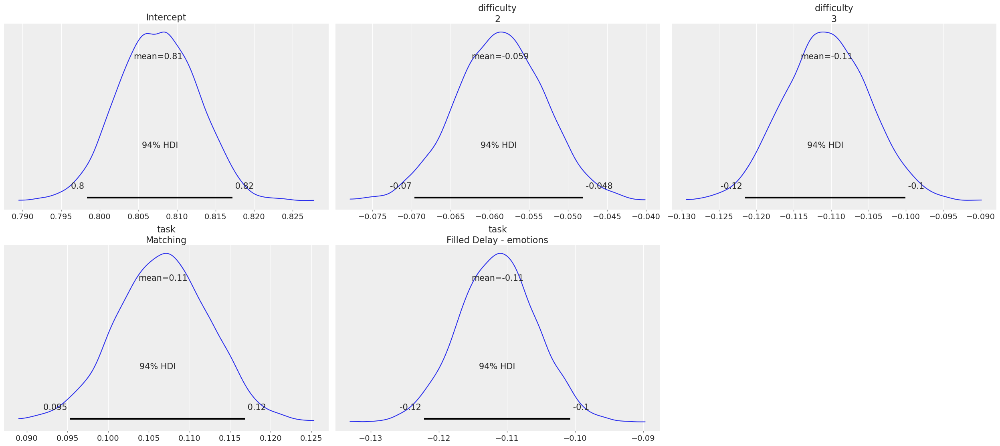

In [9]:
az.plot_posterior(result_dic_bernoulli[f][formulas2run[0]], 
                  var_names=['Intercept', 'difficulty', 'task'],#, 'task:difficulty'],
                  hdi_prob=.94)

array([[<Axes: title={'center': 'Intercept'}>,
        <Axes: title={'center': 'difficulty\n2'}>,
        <Axes: title={'center': 'difficulty\n3'}>],
       [<Axes: title={'center': 'task\nMatching'}>,
        <Axes: title={'center': 'task\nFilled Delay - emotions'}>,
        <Axes: >]], dtype=object)

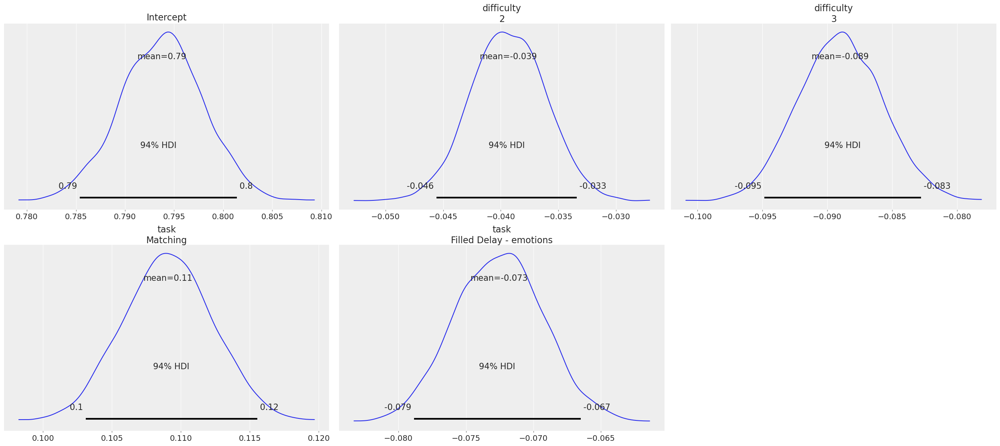

In [10]:
az.plot_posterior(result_dic_bernoulli[f][formulas2run[1]], 
                  var_names=['Intercept', 'difficulty', 'task'],#, 'task:difficulty'],
                  hdi_prob=.94)

---
## Plot results

## FMP dataset 1
[top](#top)


Dataset: dataset_1

Fitting formula correct_flt ~ task * difficulty + (1|userID)



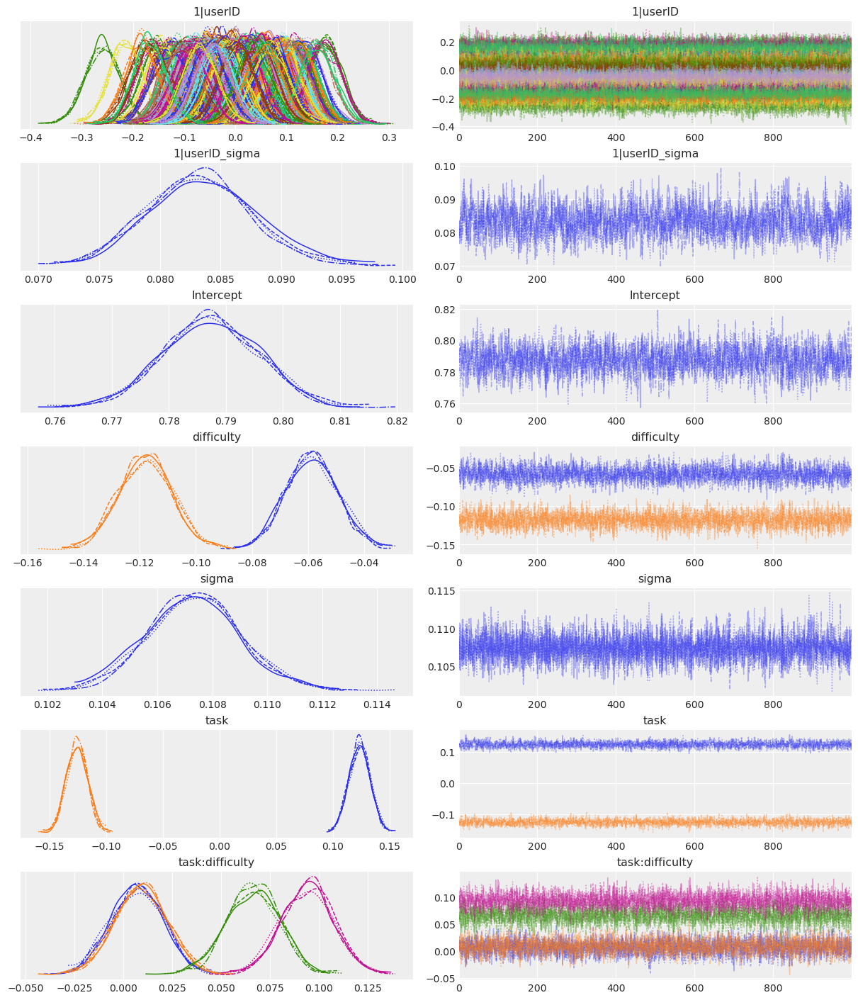

                   mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
1|userID[s_1]     0.083  0.032   0.020    0.143        0.0    0.000    8941.0   
1|userID[s_10]    0.118  0.034   0.056    0.183        0.0    0.000    8077.0   
1|userID[s_1000]  0.023  0.034  -0.037    0.090        0.0    0.001    9137.0   
1|userID[s_1004]  0.094  0.032   0.033    0.152        0.0    0.000    8793.0   
1|userID[s_1005]  0.096  0.033   0.033    0.156        0.0    0.000    8123.0   
1|userID[s_1014] -0.014  0.034  -0.075    0.049        0.0    0.001    8262.0   
1|userID[s_1021]  0.079  0.033   0.019    0.144        0.0    0.000    8080.0   
1|userID[s_1025]  0.127  0.033   0.066    0.188        0.0    0.000    7515.0   
1|userID[s_1027]  0.006  0.032  -0.056    0.066        0.0    0.001    7350.0   
1|userID[s_103]   0.101  0.033   0.040    0.162        0.0    0.000    8689.0   
1|userID[s_1032] -0.023  0.032  -0.083    0.041        0.0    0.000    7375.0   
1|userID[s_1033]  0.088  0.0

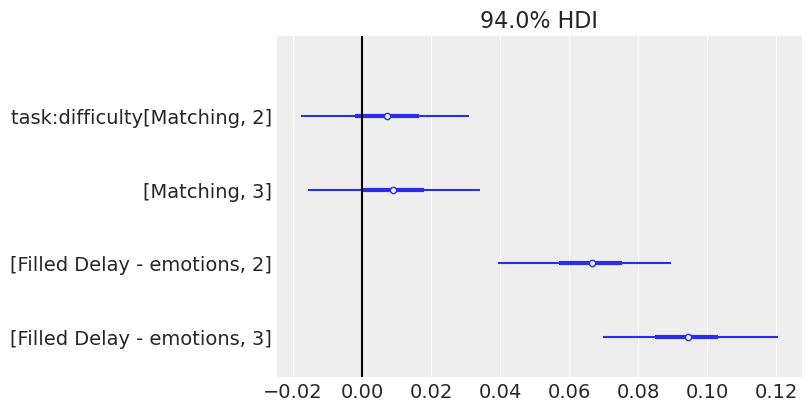

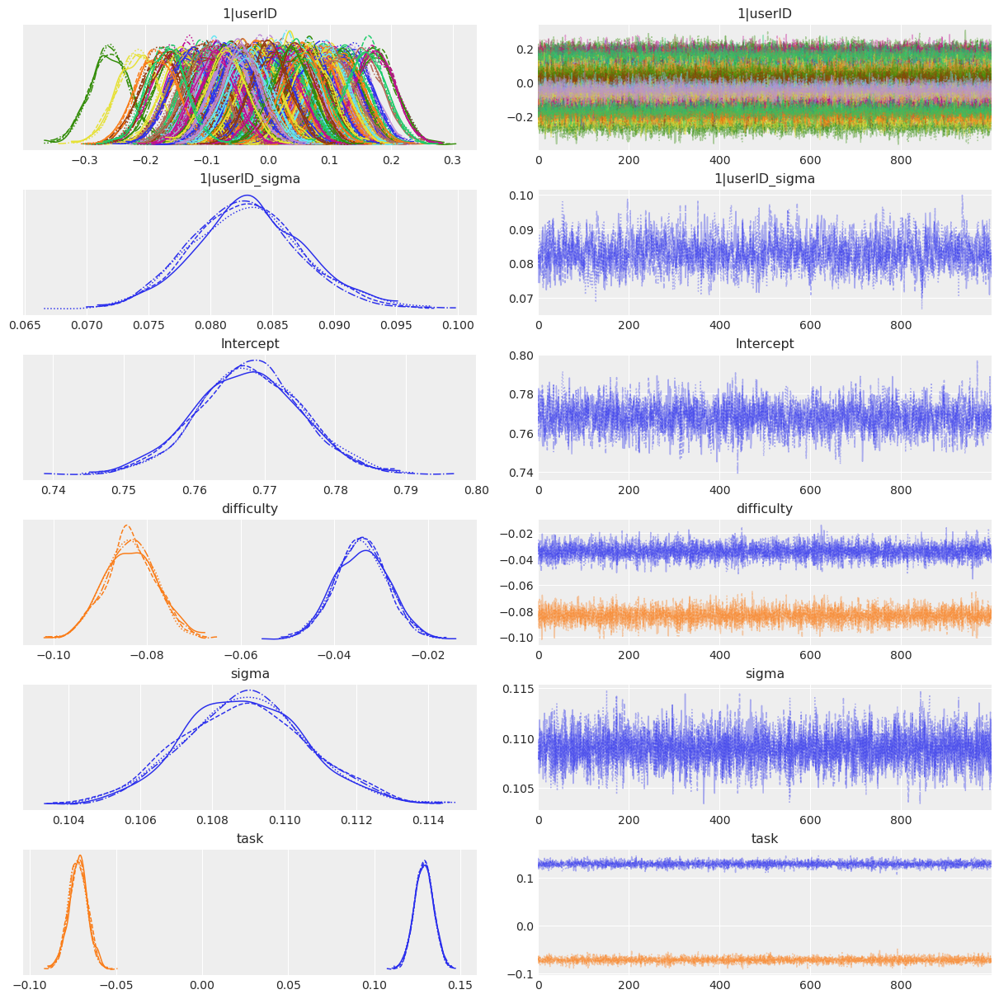

                   mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
1|userID[s_1]     0.083  0.035   0.019    0.150        0.0    0.000    6854.0   
1|userID[s_10]    0.116  0.034   0.052    0.177        0.0    0.000    7660.0   
1|userID[s_1000]  0.024  0.034  -0.043    0.083        0.0    0.000    7796.0   
1|userID[s_1004]  0.093  0.034   0.027    0.158        0.0    0.000    7358.0   
1|userID[s_1005]  0.095  0.034   0.036    0.163        0.0    0.000    6285.0   
1|userID[s_1014] -0.014  0.034  -0.079    0.048        0.0    0.001    6388.0   
1|userID[s_1021]  0.080  0.034   0.018    0.145        0.0    0.000    7434.0   
1|userID[s_1025]  0.125  0.033   0.068    0.190        0.0    0.000    6551.0   
1|userID[s_1027]  0.006  0.034  -0.055    0.070        0.0    0.001    8129.0   
1|userID[s_103]   0.100  0.034   0.040    0.164        0.0    0.000    6184.0   
1|userID[s_1032] -0.023  0.034  -0.088    0.041        0.0    0.000    7202.0   
1|userID[s_1033]  0.088  0.0

In [11]:
f = 'dataset_1'
print(f'Dataset: {f}')
for formula in formulas2run:
    print(f'\nFitting formula {formula}\n')
    print_model(model_dic_bernoulli[f][formula], result_dic_bernoulli[f][formula])

## FMP dataset 2 -- randomised stimuli matched for entropy
[top](#top)


Dataset: dataset_2

Fitting formula correct_flt ~ task * difficulty + (1|userID)



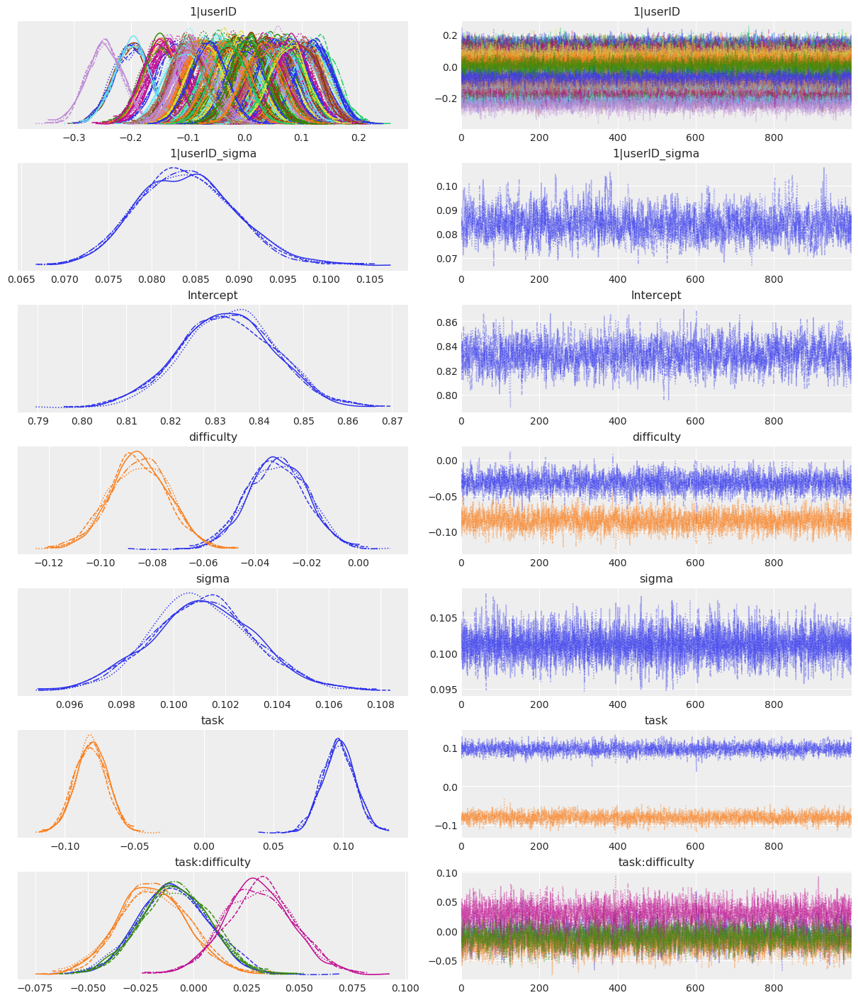

                   mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
1|userID[s_1013]  0.121  0.032   0.062    0.181        0.0    0.000    7165.0   
1|userID[s_1022]  0.116  0.032   0.054    0.174        0.0    0.000    6461.0   
1|userID[s_1026] -0.066  0.032  -0.130   -0.009        0.0    0.000    7706.0   
1|userID[s_104]  -0.134  0.032  -0.194   -0.074        0.0    0.000    6449.0   
1|userID[s_1044]  0.062  0.031   0.004    0.119        0.0    0.000    6552.0   
1|userID[s_1048] -0.000  0.031  -0.057    0.061        0.0    0.001    7541.0   
1|userID[s_105]   0.018  0.032  -0.037    0.083        0.0    0.000    6708.0   
1|userID[s_1081] -0.070  0.032  -0.132   -0.013        0.0    0.000    6953.0   
1|userID[s_1083] -0.138  0.031  -0.199   -0.082        0.0    0.000    7261.0   
1|userID[s_1103]  0.024  0.031  -0.034    0.082        0.0    0.000    7641.0   
1|userID[s_1105] -0.123  0.032  -0.183   -0.063        0.0    0.000    6818.0   
1|userID[s_1120]  0.105  0.0

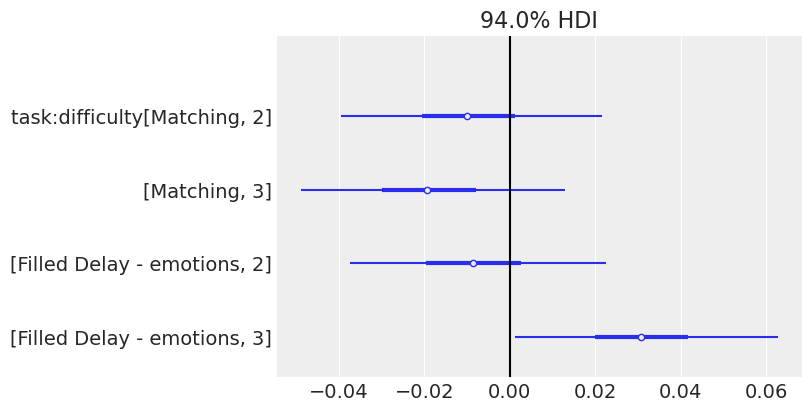

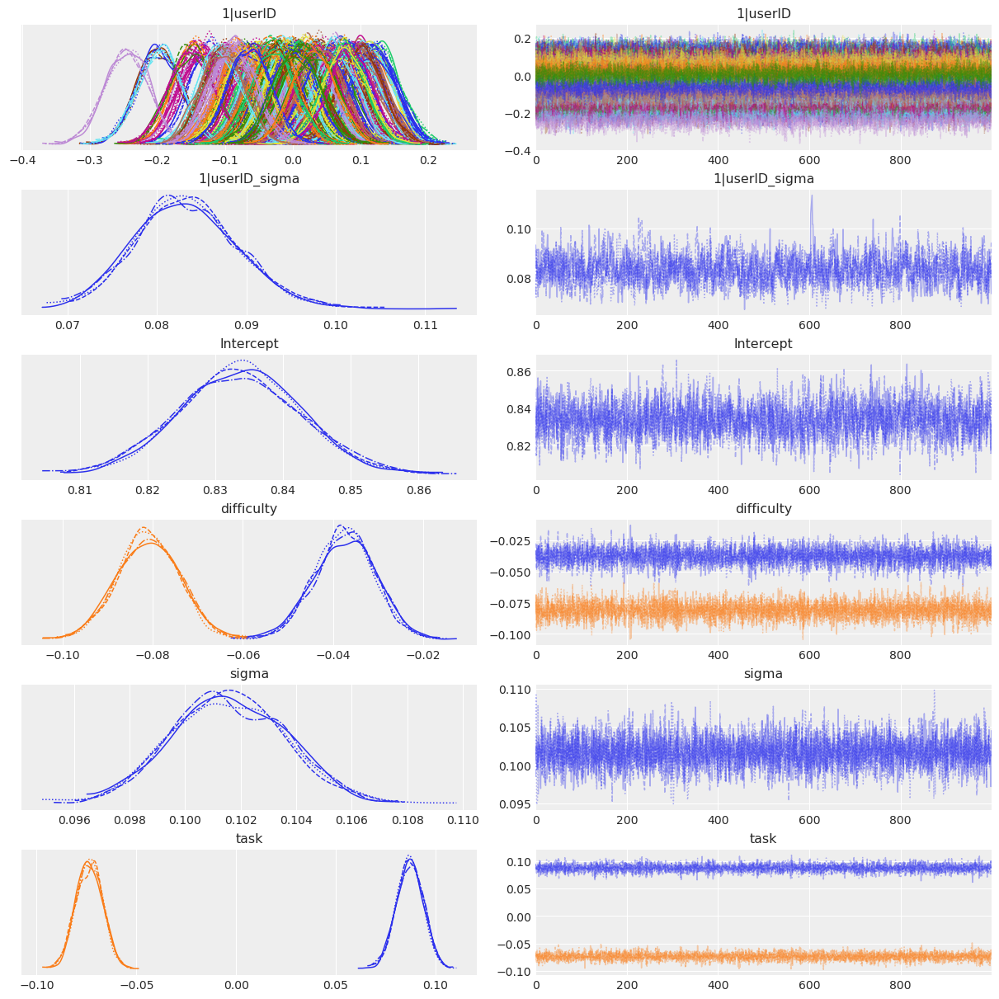

                   mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
1|userID[s_1013]  0.120  0.033   0.059    0.181        0.0    0.000    5232.0   
1|userID[s_1022]  0.115  0.032   0.053    0.173        0.0    0.000    5987.0   
1|userID[s_1026] -0.066  0.032  -0.125   -0.005        0.0    0.000    7390.0   
1|userID[s_104]  -0.134  0.033  -0.196   -0.072        0.0    0.000    6181.0   
1|userID[s_1044]  0.062  0.032  -0.002    0.118        0.0    0.000    6051.0   
1|userID[s_1048] -0.001  0.032  -0.063    0.056        0.0    0.001    6053.0   
1|userID[s_105]   0.018  0.032  -0.041    0.077        0.0    0.000    6272.0   
1|userID[s_1081] -0.070  0.032  -0.130   -0.008        0.0    0.000    6964.0   
1|userID[s_1083] -0.138  0.032  -0.196   -0.077        0.0    0.000    6350.0   
1|userID[s_1103]  0.023  0.032  -0.037    0.083        0.0    0.000    5520.0   
1|userID[s_1105] -0.122  0.031  -0.179   -0.060        0.0    0.000    6075.0   
1|userID[s_1120]  0.105  0.0

In [12]:
f = 'dataset_2'

print(f'Dataset: {f}')
for formula in formulas2run:
    print(f'\nFitting formula {formula}\n')
    print_model(model_dic_bernoulli[f][formula], result_dic_bernoulli[f][formula])

## FMP dataset 3 -- randomising cue stimulus 
[top](#top)

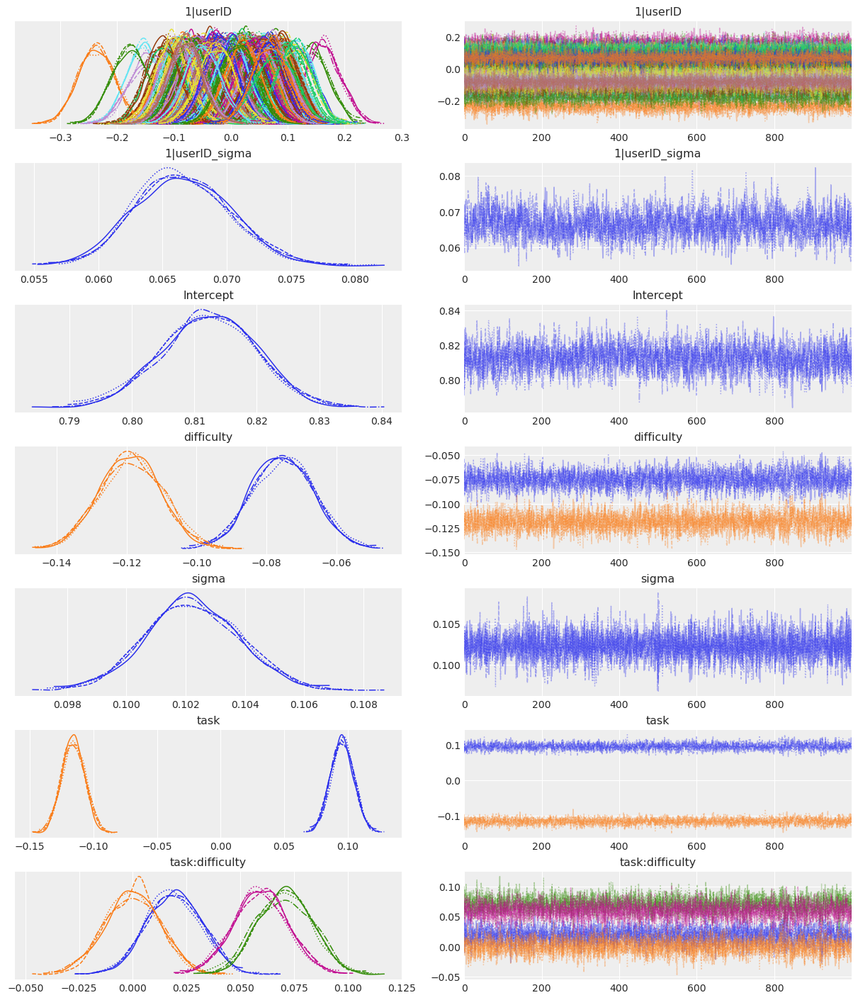

                   mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
1|userID[s_1001]  0.023  0.030  -0.031    0.078        0.0    0.000    8451.0   
1|userID[s_1002] -0.094  0.031  -0.151   -0.036        0.0    0.000    8020.0   
1|userID[s_1006]  0.031  0.031  -0.025    0.092        0.0    0.000    9566.0   
1|userID[s_1012] -0.027  0.030  -0.079    0.034        0.0    0.000    8747.0   
1|userID[s_1015] -0.010  0.032  -0.071    0.050        0.0    0.001    7671.0   
1|userID[s_1016]  0.015  0.032  -0.043    0.074        0.0    0.001    9541.0   
1|userID[s_1017] -0.051  0.031  -0.110    0.006        0.0    0.000    8947.0   
1|userID[s_1036]  0.031  0.030  -0.027    0.086        0.0    0.000    7951.0   
1|userID[s_1042] -0.003  0.031  -0.062    0.052        0.0    0.001    8897.0   
1|userID[s_1045]  0.052  0.031  -0.006    0.109        0.0    0.000    7903.0   
1|userID[s_1046] -0.017  0.034  -0.080    0.047        0.0    0.001    8118.0   
1|userID[s_1047]  0.011  0.0

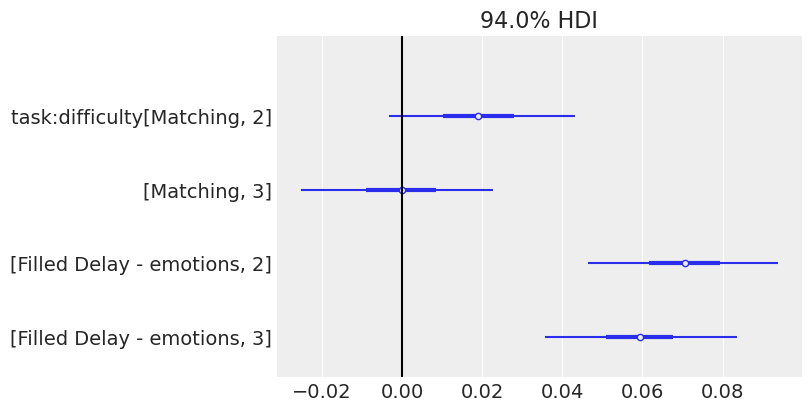

In [13]:
f = 'dataset_3'
print_model(model_dic_bernoulli[f][formulas2run[0]], result_dic_bernoulli[f][formulas2run[0]])

Dataset: dataset_3

Fitting formula correct_flt ~ task * difficulty + (1|userID)



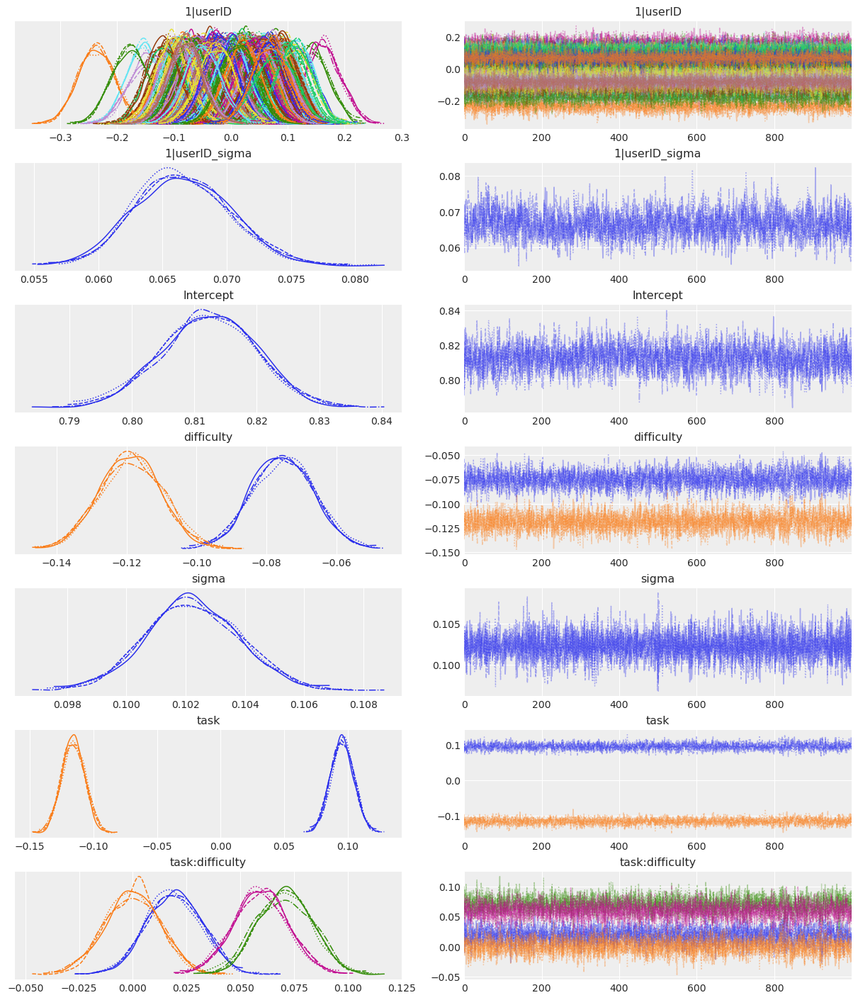

                   mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
1|userID[s_1001]  0.023  0.030  -0.031    0.078        0.0    0.000    8451.0   
1|userID[s_1002] -0.094  0.031  -0.151   -0.036        0.0    0.000    8020.0   
1|userID[s_1006]  0.031  0.031  -0.025    0.092        0.0    0.000    9566.0   
1|userID[s_1012] -0.027  0.030  -0.079    0.034        0.0    0.000    8747.0   
1|userID[s_1015] -0.010  0.032  -0.071    0.050        0.0    0.001    7671.0   
1|userID[s_1016]  0.015  0.032  -0.043    0.074        0.0    0.001    9541.0   
1|userID[s_1017] -0.051  0.031  -0.110    0.006        0.0    0.000    8947.0   
1|userID[s_1036]  0.031  0.030  -0.027    0.086        0.0    0.000    7951.0   
1|userID[s_1042] -0.003  0.031  -0.062    0.052        0.0    0.001    8897.0   
1|userID[s_1045]  0.052  0.031  -0.006    0.109        0.0    0.000    7903.0   
1|userID[s_1046] -0.017  0.034  -0.080    0.047        0.0    0.001    8118.0   
1|userID[s_1047]  0.011  0.0

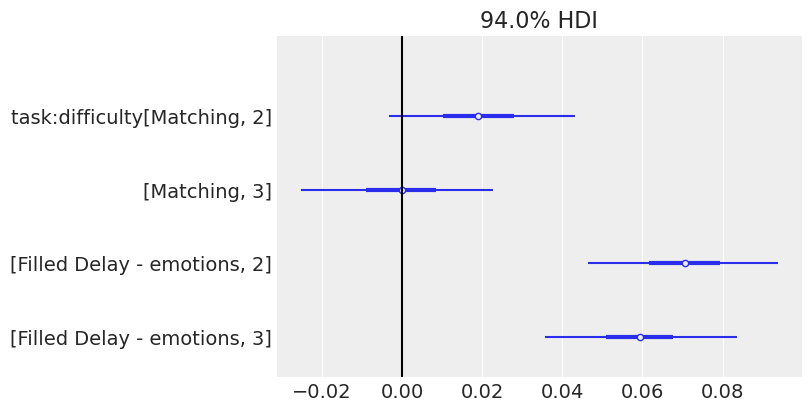

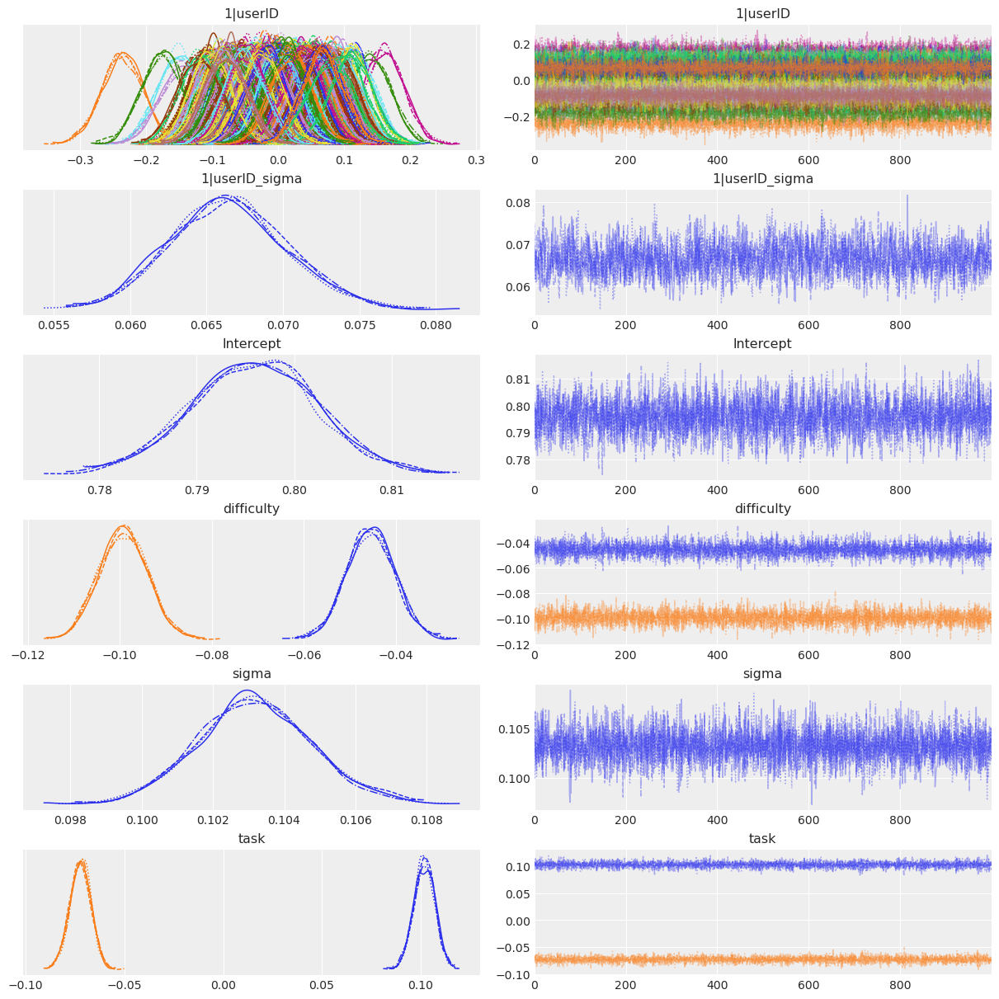

                   mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
1|userID[s_1001]  0.023  0.031  -0.034    0.081        0.0    0.000    8260.0   
1|userID[s_1002] -0.094  0.031  -0.151   -0.036        0.0    0.000    6250.0   
1|userID[s_1006]  0.031  0.031  -0.027    0.085        0.0    0.000    7162.0   
1|userID[s_1012] -0.027  0.031  -0.084    0.033        0.0    0.000    9533.0   
1|userID[s_1015] -0.010  0.031  -0.066    0.048        0.0    0.001    8025.0   
1|userID[s_1016]  0.016  0.031  -0.044    0.071        0.0    0.000    9512.0   
1|userID[s_1017] -0.051  0.031  -0.112    0.004        0.0    0.000    8959.0   
1|userID[s_1036]  0.032  0.031  -0.026    0.085        0.0    0.000    7952.0   
1|userID[s_1042] -0.002  0.030  -0.057    0.057        0.0    0.001    7297.0   
1|userID[s_1045]  0.051  0.031  -0.010    0.110        0.0    0.000    8070.0   
1|userID[s_1046] -0.017  0.035  -0.084    0.045        0.0    0.001    6796.0   
1|userID[s_1047]  0.011  0.0

In [14]:
f = 'dataset_3'

print(f'Dataset: {f}')
for formula in formulas2run:
    print(f'\nFitting formula {formula}\n')
    print_model(model_dic_bernoulli[f][formula], result_dic_bernoulli[f][formula])

## FMP concatenated dataset 1, 2, 3
[top](#top)


Dataset: concat_datasets_123

Fitting formula correct_flt ~ task * difficulty + (1|userID)



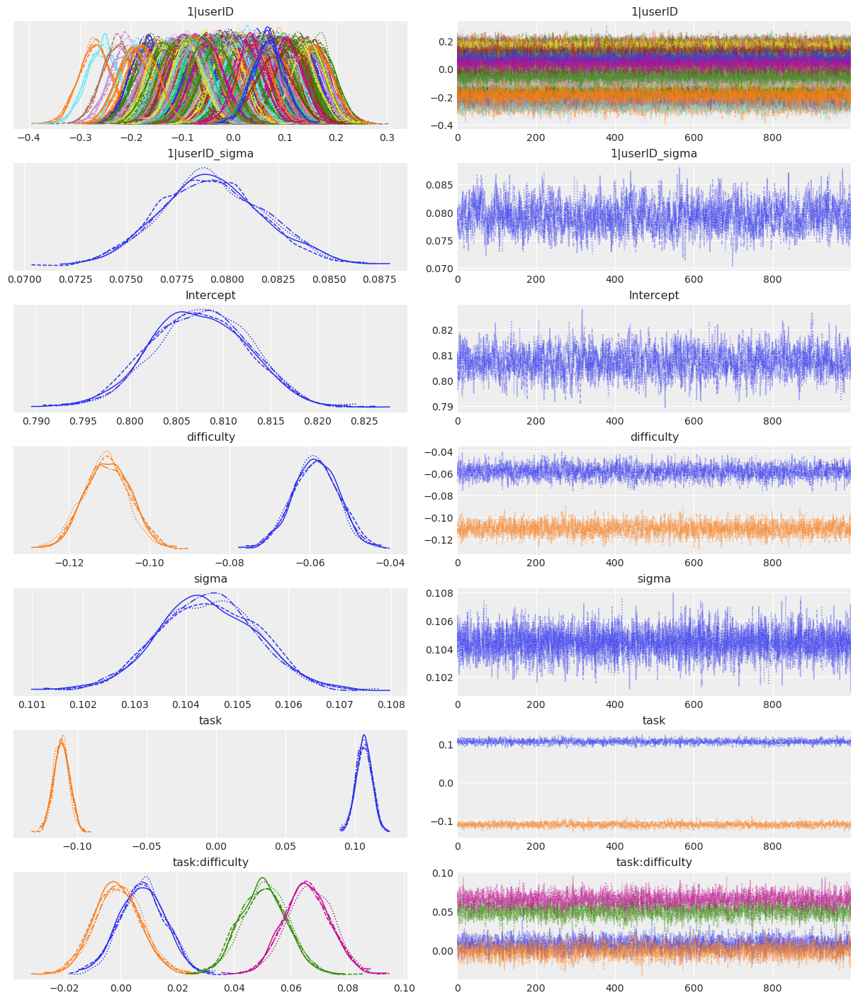

                   mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
1|userID[s_1]     0.069  0.031   0.012    0.130        0.0    0.000    6661.0   
1|userID[s_10]    0.102  0.031   0.046    0.164        0.0    0.000    7611.0   
1|userID[s_1000]  0.010  0.032  -0.050    0.070        0.0    0.001    8945.0   
1|userID[s_1001]  0.019  0.032  -0.042    0.080        0.0    0.000    6697.0   
1|userID[s_1002] -0.104  0.033  -0.168   -0.046        0.0    0.000    7026.0   
1|userID[s_1004]  0.081  0.032   0.018    0.138        0.0    0.000    6686.0   
1|userID[s_1005]  0.083  0.032   0.021    0.142        0.0    0.000    6373.0   
1|userID[s_1006]  0.028  0.032  -0.032    0.087        0.0    0.000    6169.0   
1|userID[s_1012] -0.034  0.031  -0.093    0.024        0.0    0.000    7048.0   
1|userID[s_1013]  0.147  0.032   0.089    0.210        0.0    0.000    5746.0   
1|userID[s_1014] -0.027  0.032  -0.089    0.027        0.0    0.000    6186.0   
1|userID[s_1015] -0.015  0.0

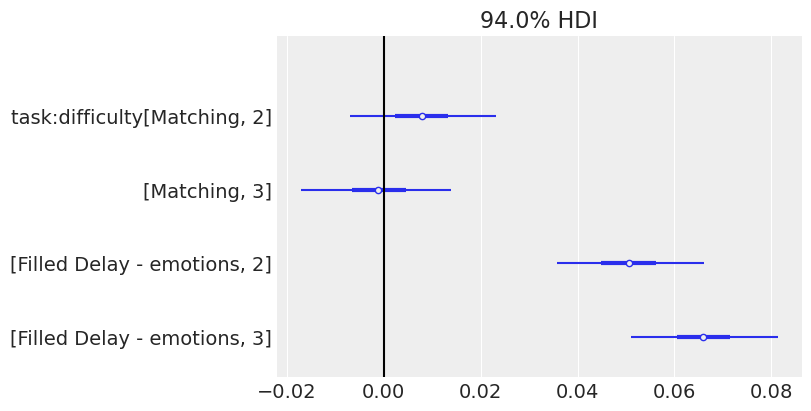

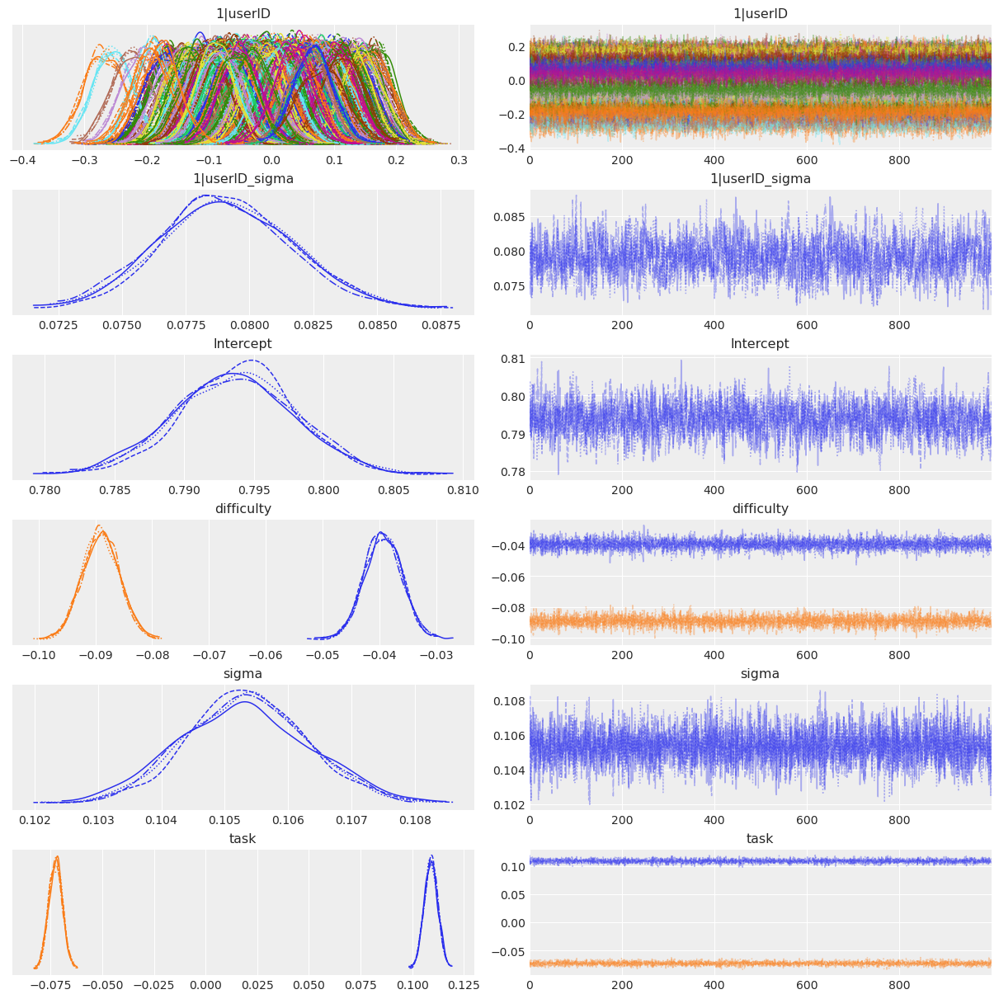

                   mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
1|userID[s_1]     0.069  0.033   0.005    0.128        0.0    0.000    7092.0   
1|userID[s_10]    0.102  0.032   0.046    0.164        0.0    0.000    6083.0   
1|userID[s_1000]  0.010  0.033  -0.050    0.070        0.0    0.001    6808.0   
1|userID[s_1001]  0.019  0.034  -0.046    0.082        0.0    0.001    8780.0   
1|userID[s_1002] -0.104  0.033  -0.168   -0.043        0.0    0.000    8335.0   
1|userID[s_1004]  0.079  0.033   0.015    0.138        0.0    0.000    8145.0   
1|userID[s_1005]  0.082  0.032   0.022    0.144        0.0    0.000    8256.0   
1|userID[s_1006]  0.028  0.033  -0.034    0.088        0.0    0.000    8221.0   
1|userID[s_1012] -0.033  0.032  -0.093    0.027        0.0    0.000    6916.0   
1|userID[s_1013]  0.147  0.033   0.086    0.208        0.0    0.000    7113.0   
1|userID[s_1014] -0.027  0.031  -0.087    0.030        0.0    0.000    7897.0   
1|userID[s_1015] -0.016  0.0

In [15]:
f = 'concat_datasets_123'

print(f'Dataset: {f}')
for formula in formulas2run:
    print(f'\nFitting formula {formula}\n')
    print_model(model_dic_bernoulli[f][formula], result_dic_bernoulli[f][formula])

### Compare all data
[top](#top)

dataset_1 

                                              rank     elpd_loo       p_loo  \
correct_flt ~ task * difficulty + (1|userID)     0  1771.111912  218.125276   
correct_flt ~ task + difficulty + (1|userID)     1  1739.763443  214.027947   

                                              elpd_diff    weight         se  \
correct_flt ~ task * difficulty + (1|userID)   0.000000  0.901539  34.107631   
correct_flt ~ task + difficulty + (1|userID)  31.348469  0.098461  34.309589   

                                                   dse  warning scale  
correct_flt ~ task * difficulty + (1|userID)  0.000000    False   log  
correct_flt ~ task + difficulty + (1|userID)  8.843179    False   log  

dataset_2 



/home/labs/paz/janka/.conda/envs/pymc_env_5/lib/python3.12/site-packages/arviz/stats/stats.py:792: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.70 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(


                                              rank     elpd_loo       p_loo  \
correct_flt ~ task * difficulty + (1|userID)     0  1127.497502  134.664407   
correct_flt ~ task + difficulty + (1|userID)     1  1123.174236  131.740013   

                                              elpd_diff    weight         se  \
correct_flt ~ task * difficulty + (1|userID)   0.000000  0.787074  28.189649   
correct_flt ~ task + difficulty + (1|userID)   4.323266  0.212926  28.232000   

                                                   dse  warning scale  
correct_flt ~ task * difficulty + (1|userID)  0.000000     True   log  
correct_flt ~ task + difficulty + (1|userID)  3.890022    False   log  

dataset_3 

                                              rank     elpd_loo       p_loo  \
correct_flt ~ task * difficulty + (1|userID)     0  1904.726509  208.645692   
correct_flt ~ task + difficulty + (1|userID)     1  1885.981558  203.840949   

                                              elpd_dif

/home/labs/paz/janka/.conda/envs/pymc_env_5/lib/python3.12/site-packages/arviz/stats/stats.py:792: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.70 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(


                                              rank     elpd_loo       p_loo  \
correct_flt ~ task * difficulty + (1|userID)     0  4778.089659  551.917903   
correct_flt ~ task + difficulty + (1|userID)     1  4728.829159  546.629129   

                                              elpd_diff    weight         se  \
correct_flt ~ task * difficulty + (1|userID)   0.000000  0.917667  56.256814   
correct_flt ~ task + difficulty + (1|userID)  49.260499  0.082333  56.650067   

                                                    dse  warning scale  
correct_flt ~ task * difficulty + (1|userID)   0.000000     True   log  
correct_flt ~ task + difficulty + (1|userID)  10.867031    False   log  



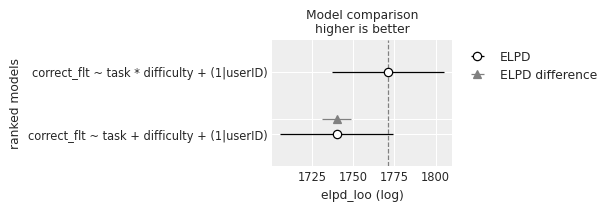

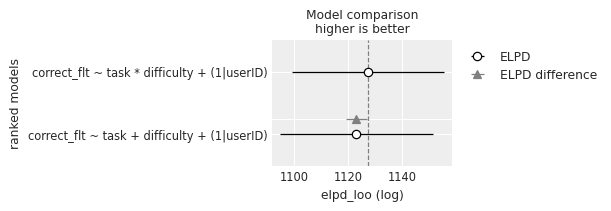

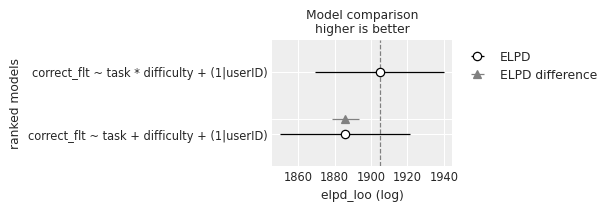

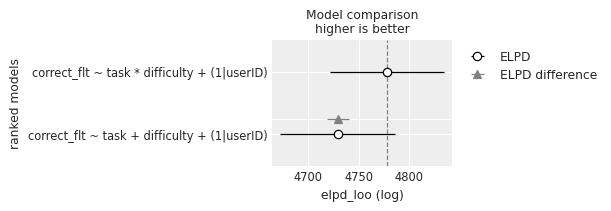

In [16]:
df_compare_formulas_bernoulli = {}
for f in result_dic_bernoulli.keys():
    print(f, '\n')
    df_compare_formulas_bernoulli[f] = az.compare(result_dic_bernoulli[f])
    
    print(df_compare_formulas_bernoulli[f])
    
    az.plot_compare(df_compare_formulas_bernoulli[f], insample_dev=False);

    
    print()
# df_compare_formulas_bernoulli[f]

Text(0.5, 0.98, 'Model comparison\nhigher is better')

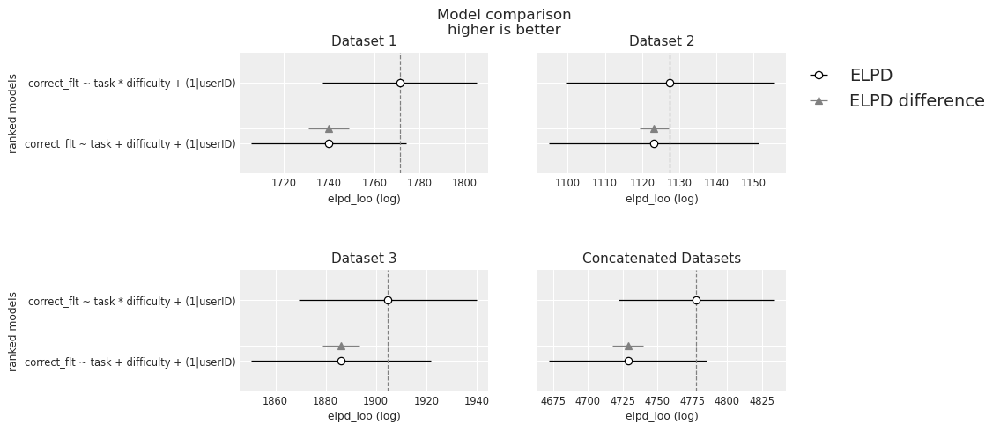

In [17]:
fig, axs = plt.subplots(2,2, figsize=(8,5), sharey=True, constrained_layout=False)
plt.subplots_adjust(hspace=0.8)

for (i,f),ax in zip(enumerate(df_compare_formulas_bernoulli.keys()), axs.flatten()):
    az.plot_compare(df_compare_formulas_bernoulli[f], insample_dev=False, ax=ax)
    
    if i==1:
        ax.legend(bbox_to_anchor=(1,1))
    else:
        ax.legend_.remove()

    if i%2==1:
        ax.set_ylabel('')
        
    t = ax.get_title()
    ax.set_title(f.replace('concat_datasets_123', 'concatenated datasets').replace('_',' ').title(), fontsize=11)
    
plt.suptitle(t)

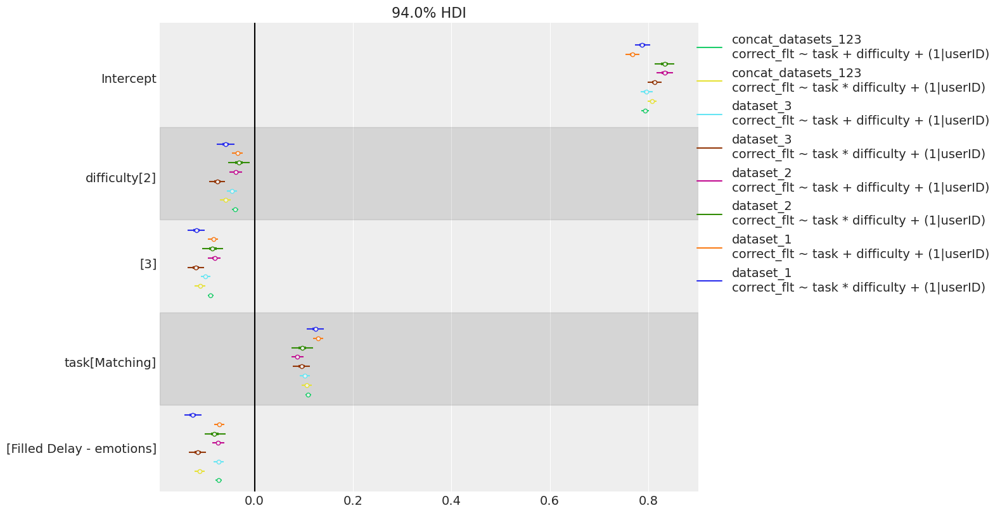

In [18]:
fig, ax = plt.subplots(figsize=(14, 8))

az.plot_forest(
    list(result_dic_bernoulli['dataset_1'].values())+\
    list(result_dic_bernoulli['dataset_2'].values())+\
    list(result_dic_bernoulli['dataset_3'].values())+\
    list(result_dic_bernoulli['concat_datasets_123'].values()),
    model_names=[f'{f}\n{formula}' for f in result_dic_bernoulli.keys() for formula in formulas2run],
    var_names=["Intercept", "difficulty", "task"],
    combined=True,
    ax=ax
)

ax.axvline(0, c='k')

# manually adjust the legend, there is some weird bug
legend = ax.get_legend()
labels = [] if legend is None else [str(x._text) for x in legend.texts]
handles = [] if legend is None else legend.legend_handles
ax.legend(handles, labels, loc="upper right", bbox_to_anchor=(1.56, 1), ncols=1)
# plt.tight_layout(rect=[0, 0, 0.85, 1])  # Adjust plot area to make space for the legend
plt.show()



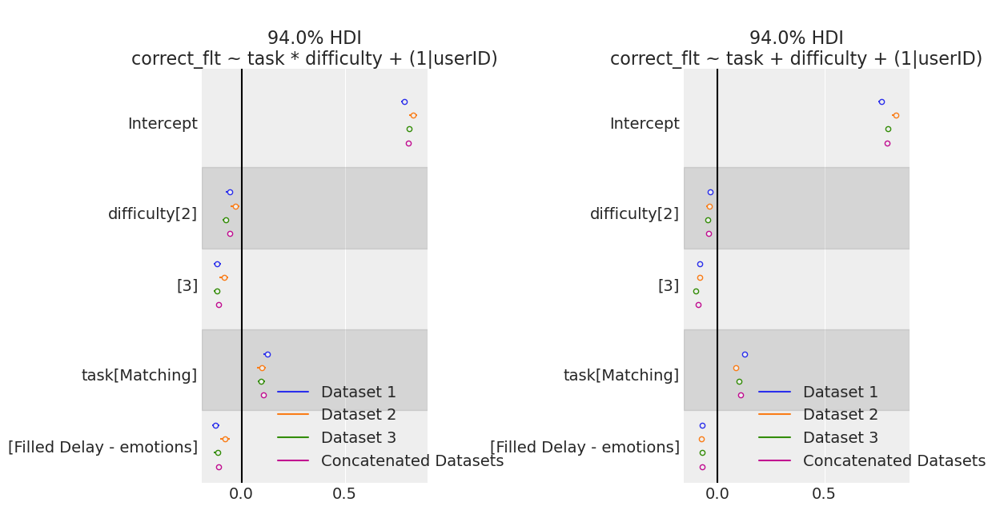

In [19]:
fig, axs = plt.subplots(1,2, figsize=(12, 6))

for i, ax in enumerate(axs.flatten()):
    az.plot_forest(
        (list(result_dic_bernoulli['dataset_1'].values())+\
        list(result_dic_bernoulli['dataset_2'].values())+\
        list(result_dic_bernoulli['dataset_3'].values())+\
        list(result_dic_bernoulli['concat_datasets_123'].values())
    )[i::2],
        model_names=[f'{f}' for f in result_dic_bernoulli.keys()],
        var_names=["Intercept", "difficulty", "task"],
        combined=True,
        ax=ax
    )
        
    ax.set_title(f'{ax.get_title()}\n{formulas2run[i]}')

    ax.axvline(0, c='k')

    # manually adjust the legend, there is some weird bug
    legend = ax.get_legend()
    labels = [] if legend is None else [str(x._text).replace('concat_datasets_123', 'concatenated datasets').replace('_',' ').title() for x in legend.texts]
    handles = [] if legend is None else legend.legend_handles
    # reorder the legend
    ax.legend(handles[::-1], labels[::-1], loc="lower right", bbox_to_anchor=(1.4, 0))
    
    
# plt.tight_layout(rect=[0, 0, 0.85, 1])  # Adjust plot area to make space for the legend
plt.show()



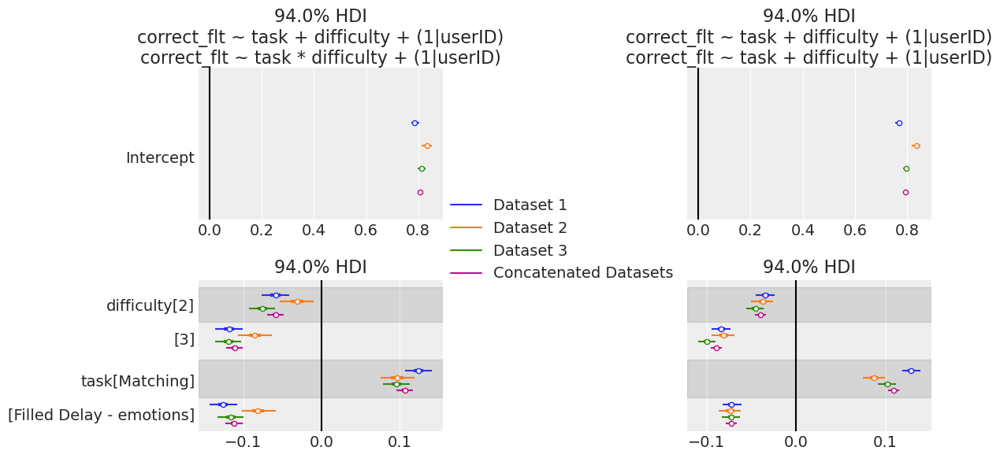

In [20]:
fig, axs = plt.subplots(2, 2, figsize=(12, 6), sharey='row', constrained_layout=False)

plt.subplots_adjust(wspace=1., hspace=0.4)

for i in range(2):

    models = (
        list(result_dic_bernoulli['dataset_1'].values()) +
        list(result_dic_bernoulli['dataset_2'].values()) +
        list(result_dic_bernoulli['dataset_3'].values()) +
        list(result_dic_bernoulli['concat_datasets_123'].values())
    )[i::2]

    # Plot 'Intercept' separately
    az.plot_forest(
        models,  # Only Intercept
        model_names=[f'{f}' for f in result_dic_bernoulli.keys()],
        var_names=["Intercept"],
        combined=True,
        ax=axs[0,i]
    )

    # Plot other variables
    az.plot_forest(
        models,
        model_names=[f'{f}' for f in result_dic_bernoulli.keys()],
        var_names=["difficulty", "task"],
        combined=True,
        ax=axs[1,i]
    )

    axs[0,i].set_title(f'{ax.get_title()}\n{formulas2run[i]}')
    
    
for i, ax in enumerate(axs.flatten()):
    ax.axvline(0, c='k')
    
    if i==0:
        # Manually adjust the legend
        legend = ax.get_legend()
        labels = [] if legend is None else [str(x._text).replace('concat_datasets_123', 'concatenated datasets').replace('_', ' ').title() for x in legend.texts]
        handles = [] if legend is None else legend.legend_handles
        ax.legend(handles[::-1], labels[::-1], loc="lower right", bbox_to_anchor=(2., -.5))
        
    else:
        ax.legend_.remove()

# # Add title and vertical line to the intercept subplot
# intercept_ax.set_title("Intercept")
# intercept_ax.axvline(0, c='k')

plt.show()


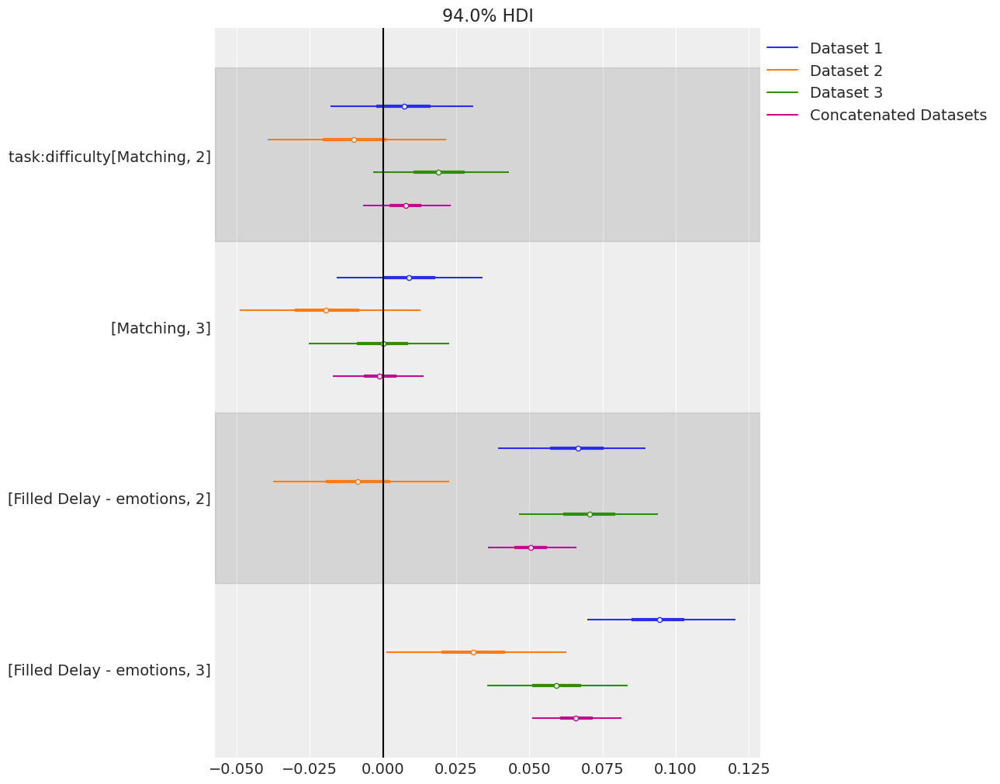

In [21]:

fig, ax = plt.subplots(figsize=(12, 10))

az.plot_forest(
    (list(result_dic_bernoulli['dataset_1'].values())+\
    list(result_dic_bernoulli['dataset_2'].values())+\
    list(result_dic_bernoulli['dataset_3'].values())+\
    list(result_dic_bernoulli['concat_datasets_123'].values())
    )[::2],
    model_names=[f'{f}' for f in result_dic_bernoulli.keys()],
    var_names=["task:difficulty"],
    combined=True,
    ax=ax
)

ax.axvline(0, c='k')

# plt.legend(loc='upper left', bbox_to_anchor=(1.05, 1), borderaxespad=0.)
# # plt.tight_layout(rect=[0, 0, 0.85, 1])  # Adjust plot area to make space for the legend
# plt.show()


# manually adjust the legend, there is some weird bug
legend = ax.get_legend()
labels = [] if legend is None else [str(x._text).replace('concat_datasets_123', 'concatenated datasets').replace('_',' ').title() for x in legend.texts]
handles = [] if legend is None else legend.legend_handles
ax.legend(handles[::-1], labels[::-1], loc="upper right", bbox_to_anchor=(1.44, 1))
# plt.tight_layout(rect=[0, 0, 0.85, 1])  # Adjust plot area to make space for the legend
plt.show()

### Run some predictions
[top](#top)

In [22]:
interactions = ['Matching, 2', 'Matching, 3', 'Filled Delay - emotions, 2', 'Filled Delay - emotions, 3']
fm2, fm3, i2, i3 = [result_dic_bernoulli[f]['correct_flt ~ task * difficulty + (1|userID)'].posterior["task:difficulty"].sel({"task:difficulty_dim":tsk}) for tsk in interactions]



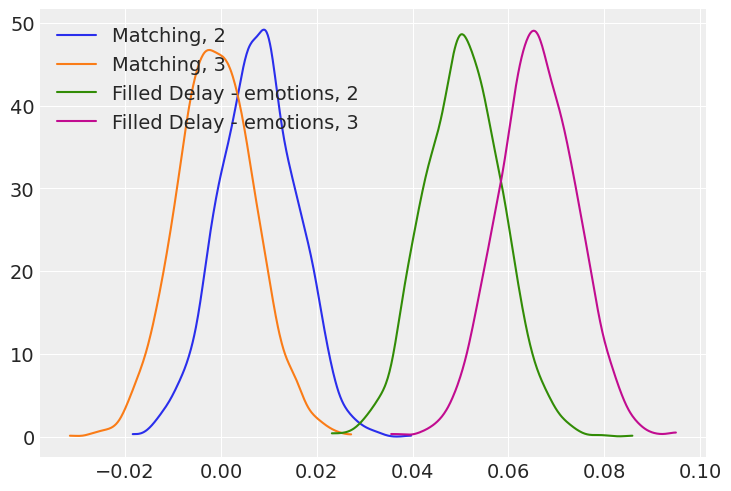

In [23]:
_, ax = plt.subplots()
for idx, x in enumerate([fm2, fm3, i2, i3]):
    az.plot_dist(x, label=x["task:difficulty_dim"].item(), plot_kwargs={"color": f"C{idx}"}, ax=ax)
ax.legend(loc="upper left");

In [24]:
# Probability that the FM slope is less than 0

print(f"""
Probability that the M slope is less than 0:
level 2: {(fm2 < 0).mean().item()}
level 3: {(fm3 < 0).mean().item()}
""")


Probability that the M slope is less than 0:
level 2: 0.17475
level 3: 0.5525



---

In [25]:
for f in result_dic_bernoulli.keys():

    fm2, fm3, i2, i3 = [result_dic_bernoulli[f]['correct_flt ~ task * difficulty + (1|userID)'].posterior["task:difficulty"].sel({"task:difficulty_dim":tsk}) for tsk in interactions]
    print(f"""
Experiment {f}:
  Probability that the M slope is less than 0:
    level 2: {(fm2 < 0).mean().item()}
    level 3: {(fm3 < 0).mean().item()}
    
  Probability that the FD-e slope is less than 0:
    level 2: {(i2 < 0).mean().item()}
    level 3: {(i3 < 0).mean().item()}
    
    """)


Experiment dataset_1:
  Probability that the M slope is less than 0:
    level 2: 0.302
    level 3: 0.25175
    
  Probability that the FD-e slope is less than 0:
    level 2: 0.0
    level 3: 0.0
    
    

Experiment dataset_2:
  Probability that the M slope is less than 0:
    level 2: 0.7265
    level 3: 0.87725
    
  Probability that the FD-e slope is less than 0:
    level 2: 0.699
    level 3: 0.02825
    
    

Experiment dataset_3:
  Probability that the M slope is less than 0:
    level 2: 0.06525
    level 3: 0.49775
    
  Probability that the FD-e slope is less than 0:
    level 2: 0.0
    level 3: 0.0
    
    

Experiment concat_datasets_123:
  Probability that the M slope is less than 0:
    level 2: 0.17475
    level 3: 0.5525
    
  Probability that the FD-e slope is less than 0:
    level 2: 0.0
    level 3: 0.0
    
    


### Save the inference
[top](#top)

It could be possible to use this:
```
result_dic_bernoulli['dataset_1']['correct_flt ~ task * difficulty + (1|userID)'].to_netcdf()
```

and the other datasets that were fitted, but it doesn't preserve the dictionary, so I use pickle.

In [26]:
# save the dictionary to a pickle file
with open(opj(path_inference_data,'FMP_Figure_2_inference_data_dict.pkl'), 'wb') as f:
    pickle.dump(result_dic_bernoulli, f)

In [27]:
# # Load the dictionary from the pickle file
# with open(opj(path_inference_data,'FMP_Figure_2_inference_data_dict.pkl'), 'rb') as f:
#     loaded_inference_data_dict = pickle.load(f)


In [28]:
%load_ext watermark

%watermark -a 'Jan Kadlec' -nmvu -iv -iv -w -p pytensor


Author: Jan Kadlec

Last updated: Fri May 16 2025

Python implementation: CPython
Python version       : 3.12.5
IPython version      : 8.25.0

pytensor: 2.23.0

Compiler    : GCC 12.4.0
OS          : Linux
Release     : 5.14.0-427.42.1.el9_4.x86_64
Machine     : x86_64
Processor   : x86_64
CPU cores   : 96
Architecture: 64bit

arviz     : 0.19.0
sys       : 3.12.5 | packaged by conda-forge | (main, Aug  8 2024, 18:36:51) [GCC 12.4.0]
numpy     : 1.26.4
matplotlib: 3.9.2
pandas    : 2.2.2
bambi     : 0.14.0

Watermark: 2.4.3



[top](#top)